# Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialgraphs2025/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc), group sizes, and many other aspects of handing in the assignment. 

_If you fail to follow those simple instructions, it will negatively impact your grade!_

**Due date and time**: The assignment is due on Tuesday November 4th, 2025 at 23:55. Hand in your IPython notebook file (with extension `.ipynb`) via DTU Learn

### GitHub Repo link (contains code and files used):
https://github.com/Lukog05/Social_Graphs_and_Interactions/tree/main/Assignment2

In the exercises below, I describe the exercises in a general way. Drawing in the right parts of the exercises is part of the assignment. (That way we're helping you get a little bit more ready for the Final Project, where you have to decide what information to include in your report and analysis). 

# Part 1: Analyze the network

The questions in this part are based on Lecture 5.

* Present an analysis/description of the network of bands/artists using tools from Lecture 5. Imagine that you have been tasked with presenting the important facts about the network to an audience who knows about network science, but doesn't know about this particular network.
   - It's OK to also use basic concepts like degree distributions (even though they're from week 4) in your analysis. That way you can make the analysis a standalone, coherent thing.
   - I would like you to include concepts like centrality and assortativity in your analysis.
   - Use a network backbone in your analysis.
   - In addition to standard distribution plots (e.g. degree distributions, etc), your analysis should also include at least one network visualization (but it doesn't have to display the entire network, you can also visualize a network backbone).
   - **Note**: As I write above, an important part of the exercise consists is *selecting the right elements of the lecture* to create a meaningful analysis. So don't solve this part by going exhaustive and just calculating everything you can think of in one massive analysis. Try to focus on using what you've learned to characterize the network. 

In this assignment we will be investigating the network of rock bands on wikipedia.

The data for this analysis was gathered from [List of mainstream rock performers](https://en.wikipedia.org/wiki/List_of_mainstream_rock_performers) page on Wikipedia.
- Using the wikipedia api and regular expressions we first get all the band names from this list
- Then we visit each bands own wikipedia page
- We look for other rock bands they link to and save them in a dictionary

<img src="WikiGatheringPic.jpg" width="1200" height="800">

Some basic statistics about our dataset:

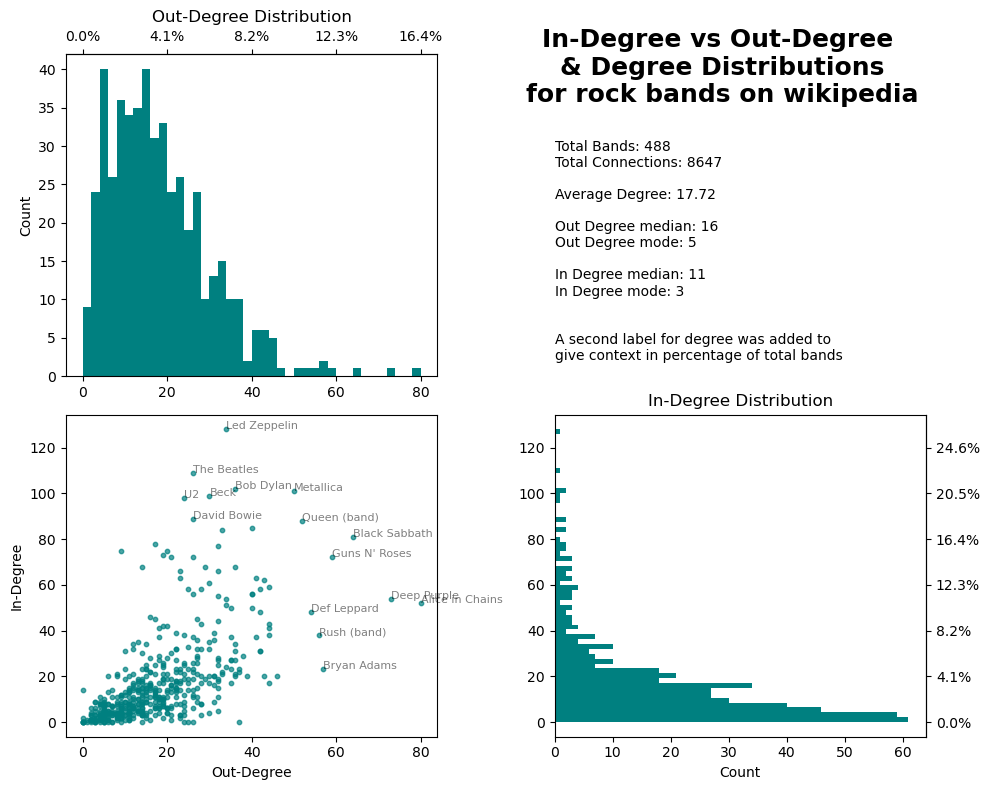

In [1]:
import json
import matplotlib.pyplot as plt

with open('bands_connections.json', 'r') as f:
    band_connections = json.load(f)

band_connections_incoming = {}
band_connections_incoming.update({k: [] for k in band_connections.keys()})

for band, connections in band_connections.items():
    for conn in connections:
        band_connections_incoming[conn].append(band)

# Degree distributions
lengths_out = {key: len(value) for key, value in band_connections.items()}
lengths_in = {key: len(value) for key, value in band_connections_incoming.items()}
x = [lengths_out[key] for key in band_connections.keys()]
y = [lengths_in[key] for key in band_connections.keys()]

plt.style.use('default')
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.title("Out-Degree Distribution")
plt.hist(x, bins=40, color='teal')
plt.ylabel("Count")
secax = plt.gca().secondary_xaxis('top')
secax.set_xticks([tick for tick in plt.gca().get_xticks()])
secax.set_xticklabels([f"{(tick / len(lengths_out)) * 100:.1f}%" for tick in plt.gca().get_xticks()])

plt.subplot(2, 2, 4)
plt.title("In-Degree Distribution")
plt.hist(y, bins=60, color='teal', orientation='horizontal')
plt.xlabel("Count")
secay = plt.gca().secondary_yaxis('right')
secay.set_yticks([tick for tick in plt.gca().get_yticks()])
secay.set_yticklabels([f"{(tick / len(lengths_in)) * 100:.1f}%" for tick in plt.gca().get_yticks()])

plt.subplot(2, 2, 3)
plt.scatter(x, y, alpha=0.7, s=10, color='teal')
for key in lengths_out.keys():
    if lengths_out[key] > 50 or lengths_in[key] > 85:
        plt.text(lengths_out[key], lengths_in[key], key, fontsize=8, alpha=0.5)
plt.xlabel("Out-Degree")
plt.ylabel("In-Degree")

plt.subplot(2, 2, 2)
plt.axis('off')
plt.text(0.45, 0.85, f"In-Degree vs Out-Degree \n& Degree Distributions\nfor rock bands on wikipedia", fontsize=18, horizontalalignment='center', fontweight='bold')
plt.text(0.0, 0.70, f"Total Bands: {len(band_connections)}", fontsize=10)
plt.text(0.0, 0.65, f"Total Connections: {sum(lengths_out.values())}", fontsize=10)
plt.text(0.0, 0.55, f"Average Degree: {sum(lengths_out.values())/len(band_connections):.2f}", fontsize=10)
plt.text(0.0, 0.45, f"Out Degree median: {sorted(lengths_out.values())[len(lengths_out)//2]}", fontsize=10)
plt.text(0.0, 0.40, f"Out Degree mode: {max(set(lengths_out.values()), key=list(lengths_out.values()).count)}", fontsize=10)
plt.text(0.0, 0.30, f"In Degree median: {sorted(lengths_in.values())[len(lengths_in)//2]}", fontsize=10)
plt.text(0.0, 0.25, f"In Degree mode: {max(set(lengths_in.values()), key=list(lengths_in.values()).count)}", fontsize=10)
plt.text(0.0, 0.05, "A second label for degree was added to\ngive context in percentage of total bands", fontsize=10)
# sorry the calculation is a bit messy and unoptimized but it runs fast enough so I didn't bother optimizing

plt.tight_layout()
plt.show()

We can observe a few things from this plot.
- Most bands have a relatively low in and out degree.
- The in and out degree distributions are different.
- Out degree distribution resembles that of a random network.
- In degree distribution resembles that of a scale-free network.

Upon investigatring how links appear on wikipedia articles I have the following theory as to why this is the case:
- Most links to other bands are in the context of "This band was an inspiration to my band"
- Out degrees describe what other bands inspired a specific band, it would make sense that most bands are inspired by an average amount of bands without too many big outliers
- In degrees describe how many other bands your band inspired, it would make sense that most bands are not that influential outside their immediate surroundings while a handful of bands become even more famous from being famous or being one of the early bands that defined the genre.

Upon investigating if there is a relation between in-out degrees and the lenght of the wikipedia article the following corrolation was found:

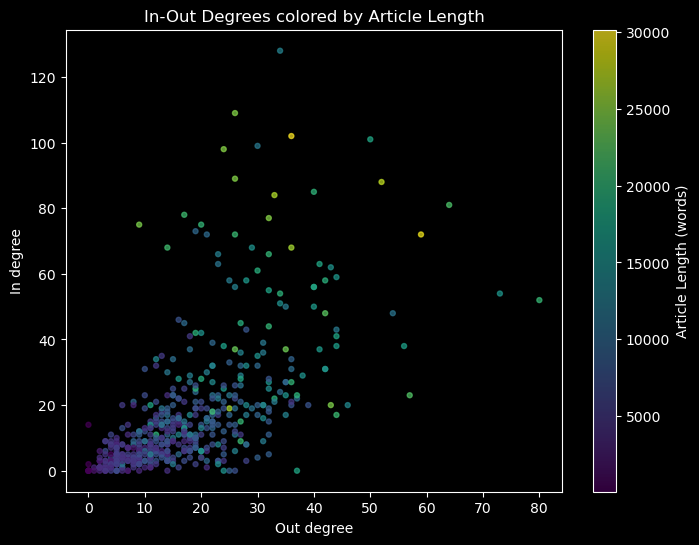

In [4]:
with open('bands_data.json', 'r') as f:
    articles = json.load(f)

# this is an approximation, it's more complicated to exactly count just the words, but this is very close
article_lengths = {key: len(articles[key].split(' ')) for key, value in articles.items()}

colors = [article_lengths[key] for key in lengths_in]

plt.style.use('dark_background')
plt.figure(figsize=(8, 6))
scatter = plt.scatter(x, y, c=colors, cmap='viridis', alpha=0.7, s=13)
plt.colorbar(scatter, label='Article Length (words)')
plt.xlabel('Out degree')
plt.ylabel('In degree')
plt.title('In-Out Degrees colored by Article Length')
plt.show()

We can observe that bands with high in or out degrees tend to also have longer wikipedia articles, and that bands with low in-out degrees tend to have shorter articles.

I have the following theories as to why this may be the case:
- The more famous a band is the more information is available about them since more people document them and they have more chances to do concerts and other things bands do.
- Longer wikipedia articles provide more chances for potential links to be added to other articles as they will be talking about more things.

Now I shall investigate wether the network exibits assortativity:

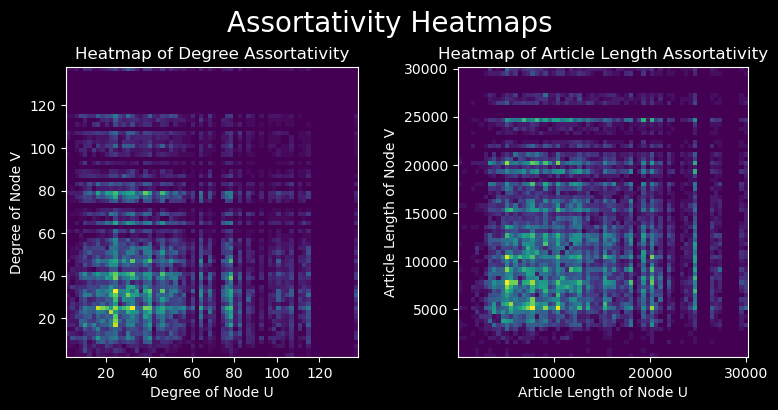

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

G_directed = nx.DiGraph(band_connections)
G_undirected = G_directed.to_undirected()

# Extract degrees of connected nodes
edges = G_undirected.edges()
degree_pairs = [(G_undirected.degree(u), G_undirected.degree(v)) for u, v in edges]
for node in G_directed.nodes:
    G_directed.nodes[node]['length_of_content'] = article_lengths.get(node, 0)

# Separate the degrees into two lists
degree_u, degree_v = zip(*degree_pairs)

bins = 68
# Create a 2D histogram for the heatmap
heatmap, xedges, yedges = np.histogram2d(degree_u, degree_v, bins=(bins, bins))
# Also include the reverse pairs to account for undirected nature
heatmap_rev, _, _ = np.histogram2d(degree_v, degree_u, bins=(bins, bins))
heatmap += heatmap_rev
# Average the counts for symmetry
heatmap = heatmap / 2


# Extract article lengths of connected nodes
article_length_pairs = [(article_lengths[u], article_lengths[v]) for u, v in edges]

# Separate the article lengths into two lists
article_length_u, article_length_v = zip(*article_length_pairs)

# Create a 2D histogram for the article length heatmap
heatmap_article, xedges_article, yedges_article = np.histogram2d(article_length_u, article_length_v, bins=(bins, bins))
# Also include the reverse pairs to account for undirected nature
heatmap_article_rev, _, _ = np.histogram2d(article_length_v, article_length_u, bins=(bins, bins))
heatmap_article += heatmap_article_rev
# Average the counts for symmetry
heatmap_article = heatmap_article / 2

# Plot the heatmaps
plt.figure(figsize=(8, 4))
plt.suptitle('Assortativity Heatmaps', fontsize=20)

# Degree assortativity heatmap
plt.subplot(1, 2, 1)
plt.title("based on degree")
plt.imshow(heatmap.T, origin='lower', cmap='viridis', interpolation='nearest', 
           extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], aspect='equal')
plt.xlabel('Degree of Node U')
plt.ylabel('Degree of Node V')
plt.title('Heatmap of Degree Assortativity')

# Article length assortativity heatmap
plt.subplot(1, 2, 2)
plt.title("based on article length")
plt.imshow(heatmap_article.T, origin='lower', cmap='viridis', interpolation='nearest', 
           extent=[xedges_article[0], xedges_article[-1], yedges_article[0], yedges_article[-1]], aspect='equal')
plt.xlabel('Article Length of Node U')
plt.ylabel('Article Length of Node V')
plt.title('Heatmap of Article Length Assortativity')

plt.tight_layout()
plt.show()


Network does not seem to exibit assortativity based on degree or on article length

Now we shall investigate how influential bands are, how their influence spreads:\
(I used [this](https://github.com/DerwenAI/disparity_filter/blob/main/disparity.py) library for the disparity filter)

In [7]:
betweenness_centrality = nx.betweenness_centrality(G_undirected)
eigenvector_centrality = nx.eigenvector_centrality(G_undirected)

import disparity as dp

G1 = G_undirected.copy()
edge_betweenness = nx.edge_betweenness_centrality(G1) # edge weight = betweenness centrality
nx.set_edge_attributes(G1, edge_betweenness, 'weight')

G2 = G1.copy()
edge_betweenness = {k: 1/v for k, v in edge_betweenness.items()} # edge weight = 1/betweenness centrality
nx.set_edge_attributes(G2, edge_betweenness, 'weight')

G1_filtered = G1.copy()
dp.disparity_filter(G1_filtered)
dp.cut_graph(G1_filtered, min_alpha_ptile=0.9)

G2_filtered = G2.copy()
dp.disparity_filter(G2_filtered)
dp.cut_graph(G2_filtered, min_alpha_ptile=0.915)

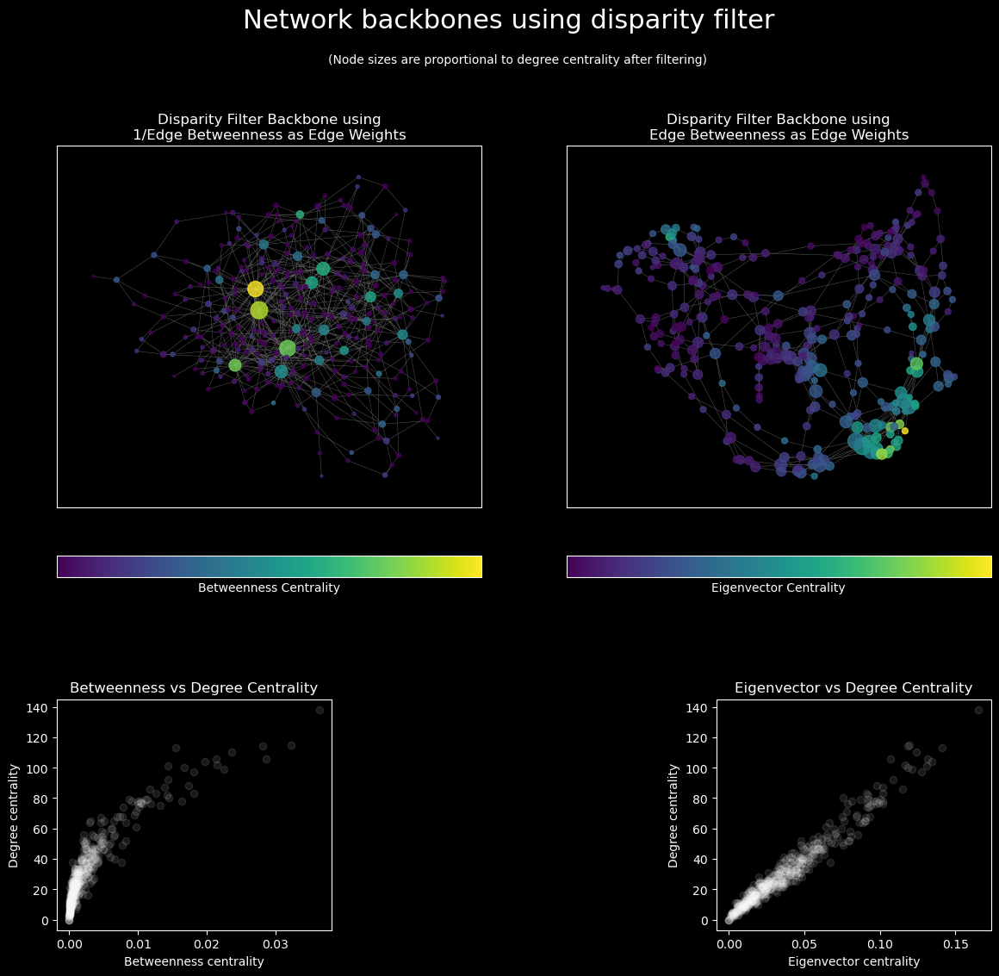

In [8]:
plt.style.use('dark_background')
plt.figure(figsize=(14, 16))
plt.suptitle('Network backbones using disparity filter', fontsize=22)
plt.figtext(0.35,0.94, "(Node sizes are proportional to degree centrality after filtering)", fontsize=10)

sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array([])

plt.subplot(2, 2, 1)
pos = nx.forceatlas2_layout(G2_filtered, gravity=0.01, seed=2)
max_degree = max(dict(G2_filtered.degree()).values())
node_colors = [betweenness_centrality[node] for node in G2_filtered.nodes()]
node_sizes = [G2_filtered.degree[node]/max_degree * 200 for node in G2_filtered.nodes()]
nx.draw_networkx(G2_filtered, pos=pos, with_labels=False, node_size=node_sizes, node_color=node_colors, cmap='viridis', alpha=0.8, edge_color='gray', width=0.3)
plt.colorbar(sm, ax=plt.gca(), label='Betweenness Centrality', orientation='horizontal', pad=0.1, ticks=[])
plt.title("Disparity Filter Backbone using\n1/Edge Betweenness as Edge Weights", fontsize=12)

plt.subplot(4, 3, 7)
x_betweenness = [betweenness_centrality[key] for key in band_connections.keys()]
y_degree = [G_undirected.degree[key] for key in band_connections.keys()]
plt.scatter(x_betweenness, y_degree, alpha=0.1, color='white')
plt.xlabel('Betweenness centrality')
plt.ylabel('Degree centrality')
plt.title('Betweenness vs Degree Centrality')

plt.subplot(2, 2, 2)
pos = nx.forceatlas2_layout(G1_filtered, gravity=0.01, seed=2)
max_degree = max(dict(G1_filtered.degree()).values())
node_colors = [eigenvector_centrality[node] for node in G1_filtered.nodes()]
node_sizes = [G1_filtered.degree[node]/max_degree * 200 for node in G1_filtered.nodes()]
nx.draw_networkx(G1_filtered, pos=pos, with_labels=False, node_size=node_sizes, node_color=node_colors, cmap='viridis', alpha=0.8, edge_color='gray', width=0.3)
plt.colorbar(sm, ax=plt.gca(), label='Eigenvector Centrality', orientation='horizontal', pad=0.1, ticks=[])
plt.title("Disparity Filter Backbone using\nEdge Betweenness as Edge Weights", fontsize=12)

plt.subplot(4, 3, 9)
x_eigen = [eigenvector_centrality[key] for key in band_connections.keys()]
plt.scatter(x_eigen, y_degree, alpha=0.1, color='white')
plt.xlabel('Eigenvector centrality')
plt.ylabel('Degree centrality')
plt.title('Eigenvector vs Degree Centrality')

#plt.tight_layout()
plt.show()

This analysis is quite experimental as the graph does not come with edge weights, which are needed for bacoboning algorithms.\
We have tried two ways of adding weights and reducing the graph into something that can be used for visualizations. Using edge betweeness centrality for the edge weights and using the inverse of it for the weights.\
Betweenness centrality reflects how often a given edge (in the scatter plot it's actually nodes) is present in random shortest paths between two nodes.\
Eigenvector centrality highlights nodes with high degree that are also connected to other nodes with high degree, it is usually used to determine a nodes influence on the network.

What I'd guess the comparison may be is if you were to ask two bands what bands influenced them both, betweenness centrality would reflect the probability of a specific band being mentioned.\
And if you just asked any rock band which band influenced them, eigenvector would be the probability that a specific band influenced them.

Incidentally we can observe that desparity filtering with inverse edge betweennsess values seems to result in network topology which highlights nodes with high betweenness and leaves more edges for them,
while filtering with just edge betweenness as weights results in network topology that has some clear relation with eigenvector centrality.

>### The below 4 cells contain pre-requisite code from Week7 exercise which is needed in order to solve the questions in Part2 and Part3 of the Assignment2

In [3]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter, defaultdict
import re
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import warnings
warnings.filterwarnings('ignore')

In [7]:
# Loading network data from JSON file which contains bands connections
print("Loading network from bands_connections.json...")
with open('bands_connections.json', 'r') as f:
    connections = json.load(f)

# Creating an undirected graph from the connections
G = nx.Graph()
for source, targets in connections.items():
    for target in targets:
        G.add_edge(source, target)

print(f"Network loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

Loading network from bands_connections.json...
Network loaded: 483 nodes, 7138 edges


In [8]:
#Loading Wikipedia data from JSON file which contains bands information
print("Loading Wikipedia data from bands_data.json...")
with open('bands_data.json', 'r') as f:
    wiki_data = json.load(f)

print(f"Wikipedia data loaded for {len(wiki_data)} bands")


Loading Wikipedia data from bands_data.json...
Wikipedia data loaded for 489 bands


In [9]:
from bs4 import BeautifulSoup
import re

def extract_genres_from_infobox(infobox_html):
    '''Parse Wikipedia infobox HTML and extract genres'''
    if not infobox_html:
        return []
    
    try:
        soup = BeautifulSoup(infobox_html, 'html.parser')
        genres = []
        
        # Find all rows in the infobox
        rows = soup.find_all('tr')
        
        for row in rows:
            # Look for label cells containing 'Genre' or 'Genres'
            label_cell = row.find('td', class_='infobox-label')
            if not label_cell:
                label_cell = row.find('th')
            
            if label_cell:
                label_text = label_cell.get_text(strip=True).lower()
                
                # Check if this row contains genre information
                if 'genre' in label_text or 'style' in label_text:
                    # Get the data cell
                    data_cell = row.find('td', class_='infobox-data')
                    if not data_cell:
                        tds = row.find_all('td')
                        if len(tds) > 1:
                            data_cell = tds[1]
                    
                    if data_cell:
                        # Extract text (handles links automatically)
                        genre_text = data_cell.get_text(separator=', ', strip=True)
                        # Split by common delimiters
                        genre_items = re.split(r'[,;/]|\band\b', genre_text)
                        for g in genre_items:
                            g = g.strip().lower()
                            if g and len(g) > 1:
                                genres.append(g)
        
        return genres
    except Exception as e:
        return []


## Part 2: Genres, Communities and Plotting

> * A Genre is a category used to sort or organize things that have share similar characteristics, themes and such.
> * In music, a genre is a category that describes the style and characteristics of songs or bands.

> * The textbook definition of Modularity is " measure used in network science to check how well a network can be divided into communities".
> * Imagine every band is a node and the edges link bands which have collaborated with each other.
> * If bands of same genre are connected to each other, i.e., they collaborate with each other a lot, then the genres form a strong community in the network.
> * For undirected, unweighted graphs, the value of modularity ranges from -0.5 to 1.0
> * Values > 0.3 => Significant community structure
> * Values close to 0 => Possible random structure of community


Extracted genres for 488 bands
Average genres per band: 4.11
Total distinct genres: 216

Top 15 genres:
 1. hard rock                      - 150 bands
 2. alternative rock               - 146 bands
 3. rock                           - 114 bands
 4. pop rock                       - 107 bands
 5. alternative metal              -  61 bands
 6. blues rock                     -  57 bands
 7. pop                            -  52 bands
 8. heavy metal                    -  52 bands
 9. soft rock                      -  45 bands
10. (early)                        -  44 bands
11. post-grunge                    -  43 bands
12. progressive rock               -  36 bands
13. indie rock                     -  36 bands
14. new wave                       -  34 bands
15. folk rock                      -  34 bands


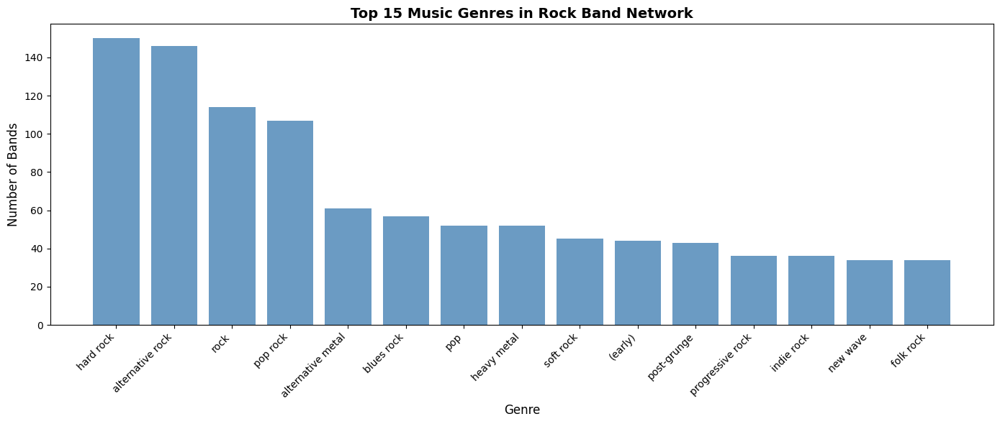

In [ ]:
# Extracting genres for all bands
band_genres = {}
all_genres_counter = Counter()

for band_name, band_data in wiki_data.items():
    infobox_html = band_data.get('infobox_html', '')
    genres = extract_genres_from_infobox(infobox_html)
    
    if genres:
        # Clean and normalize genres
        cleaned_genres = []
        for g in genres:
            g = g.lower().strip()
            g = g.replace("rock'n'roll", "rock and roll")
            g = g.replace("rock & roll", "rock and roll")
            g = g.replace("rock n roll", "rock and roll")
            if g and len(g) > 1:
                cleaned_genres.append(g)
        
        if cleaned_genres:
            band_genres[band_name] = cleaned_genres
            all_genres_counter.update(cleaned_genres)

print(f"\nExtracted genres for {len(band_genres)} bands")
print(f"Average genres per band: {np.mean([len(g) for g in band_genres.values()]):.2f}")
print(f"Total distinct genres: {len(all_genres_counter)}")

# Top 15 genres - Just for easier visualization and relevance
print(f"\nTop 15 genres:")
top_15_genres = all_genres_counter.most_common(15)
for i, (genre, count) in enumerate(top_15_genres, 1):
    print(f"{i:2d}. {genre:30s} - {count:3d} bands")

# Visualizing top 15 genres
if top_15_genres:
    plt.figure(figsize=(14, 6))
    genres_list, counts_list = zip(*top_15_genres)
    plt.bar(range(len(genres_list)), counts_list, color='steelblue', alpha=0.8)
    plt.xlabel('Genre', fontsize=12)
    plt.ylabel('Number of Bands', fontsize=12)
    plt.title('Top 15 Music Genres in Rock Band Network', fontsize=14, fontweight='bold')
    plt.xticks(range(len(genres_list)), genres_list, rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    plt.close()


### Two ways for Community detection - Using Random genre selection and Using Louvian algorithm

> ### Method1: Random genre selection 

In [ ]:
# Creating genre-based communities
genre_communities = {}
nodes_with_first_genre = []

for band in G.nodes():
    if band in band_genres:
        first_genre = band_genres[band][0]
        if first_genre not in genre_communities:
            genre_communities[first_genre] = []
        genre_communities[first_genre].append(band)
        nodes_with_first_genre.append(band)

# Create subgraph with only nodes that have genres
G_genre = G.subgraph(nodes_with_first_genre).copy()
print(f"Working with subgraph: {G_genre.number_of_nodes()} nodes with genre information")

# Calculate modularity using first genre
partition_first = {node: list(genre_communities.keys()).index(band_genres[node][0]) 
                   for node in G_genre.nodes() if node in band_genres}

from networkx.algorithms import community as nx_comm
modularity_first = nx_comm.modularity(G_genre, 
                                      [set(nodes) for nodes in genre_communities.values()])

print(f"\nModularity (using FIRST genre): {modularity_first:.4f}")
print(f"Number of genre communities: {len(genre_communities)}")

# Try with random genre selection
print("\nTesting modularity with RANDOM genre selection...")
np.random.seed(42)
random_genre_communities = {}
for band in G_genre.nodes():
    if band in band_genres and len(band_genres[band]) > 1:
        random_genre = np.random.choice(band_genres[band])
    elif band in band_genres:
        random_genre = band_genres[band][0]
    else:
        continue
    
    if random_genre not in random_genre_communities:
        random_genre_communities[random_genre] = []
    random_genre_communities[random_genre].append(band)

modularity_random = nx_comm.modularity(G_genre,
                                       [set(nodes) for nodes in random_genre_communities.values()])

print(f"Modularity (using RANDOM genre): {modularity_random:.4f}")

Working with subgraph: 483 nodes with genre information

Modularity (using FIRST genre): 0.0916
Number of genre communities: 80

Testing modularity with RANDOM genre selection...
Modularity (using RANDOM genre): 0.0311


> ### Method2: Louvian algorithm

In [12]:
# Louvain algorithm
from networkx.algorithms import community as nx_comm
communities = nx_comm.louvain_communities(G_genre, seed=42)

print(f"Detected {len(communities)} structural communities")

# Calculate modularity
modularity_structural = nx_comm.modularity(G_genre, communities)
print(f"Modularity (structural communities): {modularity_structural:.4f}")

# Community sizes
community_sizes = sorted([len(c) for c in communities], reverse=True)
print(f"\nCommunity sizes (top 10): {community_sizes[:10]}")

print(f"\nCOMPARISON:")
print(f"Genre-based modularity:      {modularity_first:.4f}")
print(f"Structural modularity:       {modularity_structural:.4f}")
print(f"Difference:                  {modularity_structural - modularity_first:+.4f}")
print(f"\nThe structural communities have {'HIGHER' if modularity_structural > modularity_first else 'LOWER'} modularity,")
print(f"indicating that network structure {'does not perfectly align' if modularity_structural > modularity_first else 'aligns well'} with musical genres.")


Detected 5 structural communities
Modularity (structural communities): 0.3106

Community sizes (top 10): [168, 130, 104, 77, 4]

COMPARISON:
Genre-based modularity:      0.0916
Structural modularity:       0.3106
Difference:                  +0.2190

The structural communities have HIGHER modularity,
indicating that network structure does not perfectly align with musical genres.


> * Structural communities are found by analyzing the network while genre-based communities are found based on external labels or attributes assigned to a node.
> * The Louvian algorithm detected 5 structural communities with mod val of 0.3106 which is better than genre based one by a diff of almost 0.2190.
> * This can indicate that actual network topology reveals disticnt communities that are organized according to musical genre. Instead, this may likely represent collab patterns, historical groupings or something similar that emerge from actual connection patterns in data.

Creating network visualization with top communities...


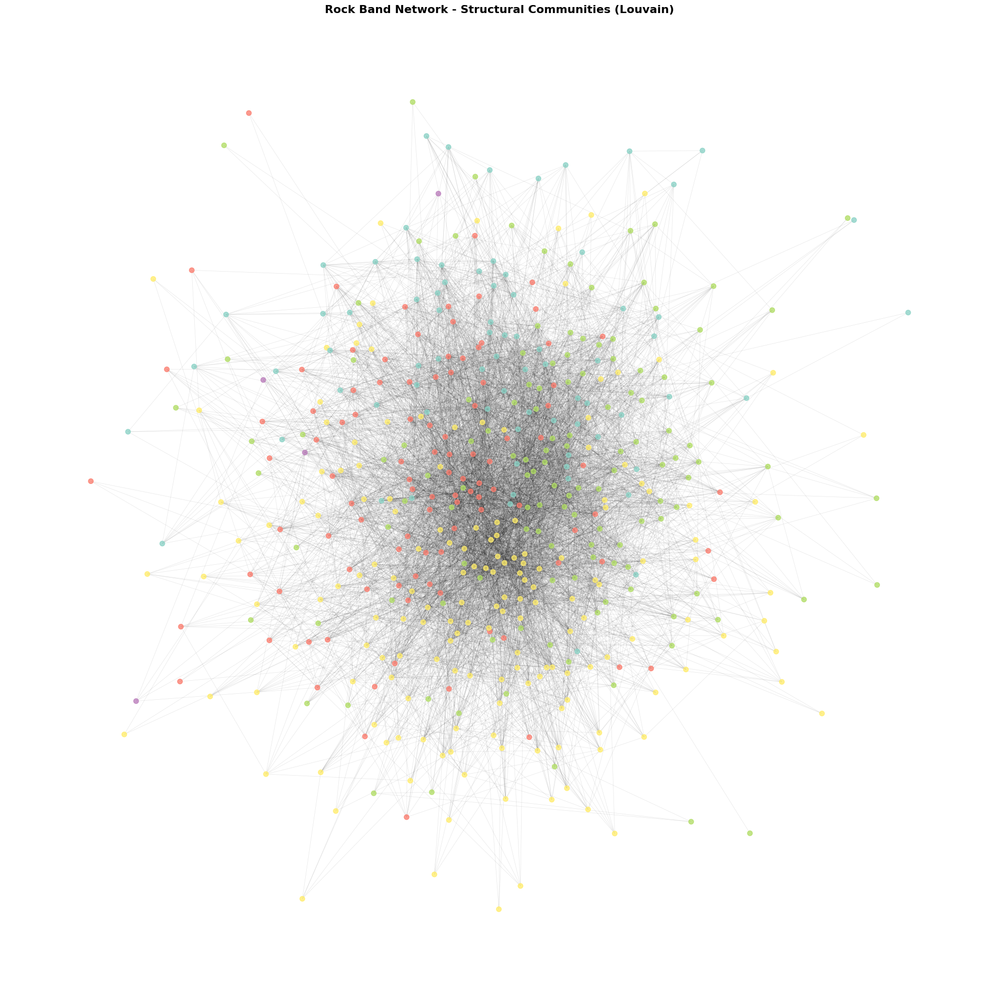

In [ ]:
# Visualizing top communities
# Assiging colors to top communities so that largest ones get distinct colors
community_map = {}
for i, comm in enumerate(communities):
    for node in comm:
        community_map[node] = i

# Using only top 5-10 largest communities for coloring because there are many small ones with few nodes
top_n_communities = 7
large_communities = communities[:top_n_communities]
node_colors = []
for node in G_genre.nodes():
    # Find which community this node belongs to
    for i, comm in enumerate(large_communities):
        if node in comm:
            node_colors.append(i)
            break
    else:
        node_colors.append(top_n_communities)  # Color Gray for small communities

plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G_genre, k=0.5, iterations=50, seed=42)
nx.draw_networkx_nodes(G_genre, pos, 
                       node_color=node_colors,
                       node_size=50,
                       cmap=plt.cm.Set3,
                       alpha=0.8)
nx.draw_networkx_edges(G_genre, pos, alpha=0.1, width=0.5)
plt.title('Rock Band Network - Structural Communities (Louvain)', 
          fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

> * The first thing we noticed is that largest communities were densely packed and clustered. This suggests that strong conenction within these groups.
> * A substansial no.of nodes are also present which represent small communities or isolated bands.
> * The most striking feature is the dense central core of the network as seen above. Most of the collaborative links start from here which indicates majority of interactions happens inside largest communities.

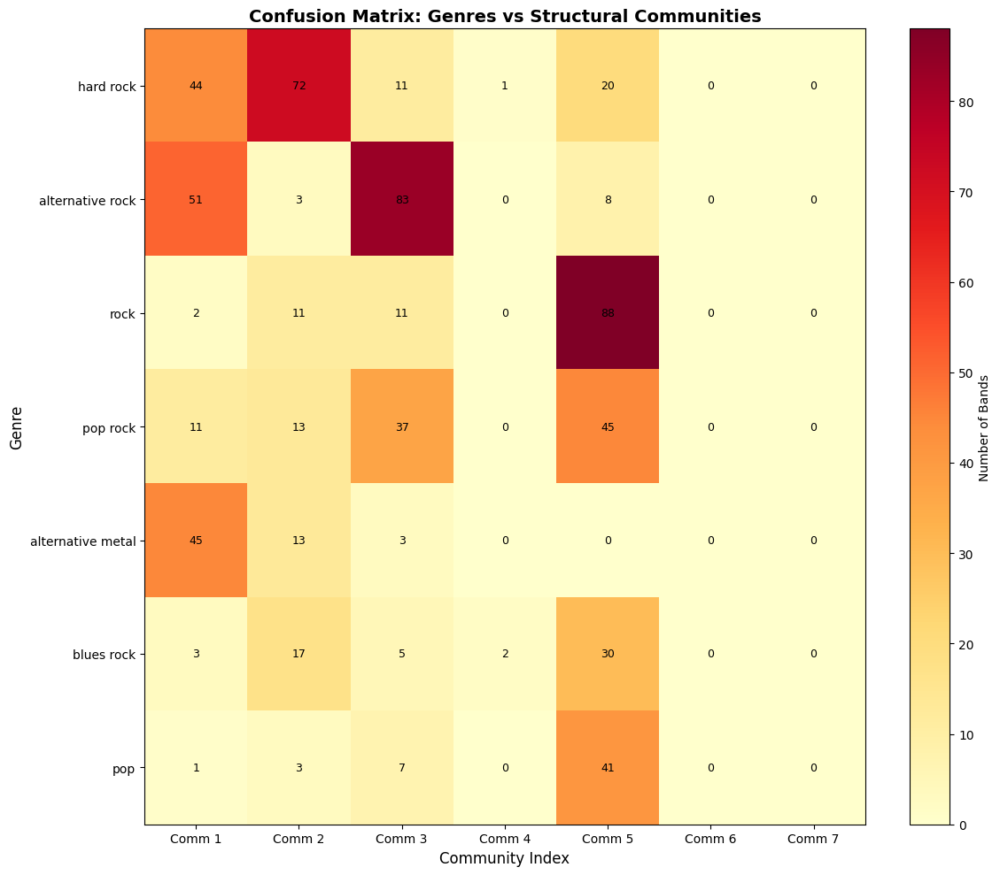

In [14]:
# Get top 7 genres and top 7 communities
top_7_genre_names = [g for g, _ in top_15_genres[:7]]
top_7_communities = communities[:7]

# Build confusion matrix
confusion_matrix = np.zeros((7, 7))

for band in G_genre.nodes():
    if band not in band_genres:
        continue
    
    # Check which genres this band has (from all genres)
    band_genre_set = set(band_genres[band])
    
    # Check which community this band belongs to
    comm_idx = None
    for i, comm in enumerate(top_7_communities):
        if band in comm:
            comm_idx = i
            break
    
    if comm_idx is None:
        continue
    
    # Update confusion matrix for each genre this band has
    for genre_idx, genre_name in enumerate(top_7_genre_names):
        if genre_name in band_genre_set:
            confusion_matrix[genre_idx, comm_idx] += 1

# Plot confusion matrix
plt.figure(figsize=(12, 10))
plt.imshow(confusion_matrix, cmap='YlOrRd', aspect='auto')
plt.colorbar(label='Number of Bands')
plt.xlabel('Community Index', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.title('Confusion Matrix: Genres vs Structural Communities', 
          fontsize=14, fontweight='bold')
plt.yticks(range(7), [g[:25] for g in top_7_genre_names])
plt.xticks(range(7), [f'Comm {i+1}' for i in range(7)])

# Add text annotations
for i in range(7):
    for j in range(7):
        text = plt.text(j, i, int(confusion_matrix[i, j]),
                       ha="center", va="center", color="black", fontsize=9)

plt.tight_layout()
plt.show()
plt.close()


> * From the confusion matrix above along with the network visulaizations we did before, we can deduce a lot about collaborative patterns rather than genres alone.
> * Main Findings from confusion matrix at a glance:
    > * Several genres are highly concentrated in 1 main community (Comm 5). 
    > * The same genre is often present in multiple communities though the number varies i.e., Bands with same genre split between several communities.
    > * The pattern is not purely diagnol which implies that there is partial but not perfect alignment between genres and communities.

> 

## Part 3: TF-IDF to understand genres and communities

TF-IDF (Term Frequency - Inverse Document Frequency) is a statistic used to identify how important a word is in a document or collection of documents. It balances 2 factors:
> * TF: How often a word (like 'rock' appears in a single doc)
> * IDF: How frequent or rare that word is across a collection of documents(like communities)

A high TF-IDF score => Frequent in one community but not frequent in other communities.

* TF-IDF can help in identifying distinctive genres. It can pinpoint which genres act like a characteristic for a community. Example, if 'rock' has a high TF-IDF value in 1 community then it means common and disticntive there which further helps in labelling the community.
* Also IDF reduces the value of genres that are common (again say like 'rock') and TF-IDF focuses attention on the terms which help differentiate between the communities.
* By calculating TF-IDF scores and doing the diminishing value like above, we can kind of 'label' the communities and create a profile for them. 

In [ ]:
# Preparing genre documents: Later used for TF-IDF analysis to identify distinctive terms for each genre
genre_documents = {}
for genre_name, _ in top_15_genres:
    doc_text = []
    for band in G_genre.nodes():
        if band in band_genres and genre_name in band_genres[band]:
            if band in wiki_data:
                doc_text.append(wiki_data[band].get('text', ''))
    
    genre_documents[genre_name] = ' '.join(doc_text)
    print(f"  {genre_name:30s} - {len(doc_text):3d} bands, {len(genre_documents[genre_name]):7d} chars")

# Text cleaning function: To preprocess text data for TF-IDF analysis by removing noise and standardizing the format.
def clean_text(text):
    """Clean and tokenize text"""
    # Lowercase
    text = text.lower()
    # Removing punctuation and numbers
    text = re.sub(r'[^a-z\s]', ' ', text)
    # Tokenize
    tokens = word_tokenize(text)
    # Removing stopwords: stopwords are common words that add little meaning
    stop_words = set(stopwords.words('english'))
    tokens = [w for w in tokens if w not in stop_words and len(w) > 2]
    # Lemmatize : Is optional but implemented here because the wordclouds are for some reason not looking good without it
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(w) for w in tokens]
    return tokens



Preparing documents for top 15 genres...
  hard rock                      - 148 bands, 4286789 chars
  alternative rock               - 145 bands, 4168333 chars
  rock                           - 112 bands, 4499789 chars
  pop rock                       - 106 bands, 3211941 chars
  alternative metal              -  61 bands, 1747414 chars
  blues rock                     -  57 bands, 1543701 chars
  pop                            -  52 bands, 2563681 chars
  heavy metal                    -  52 bands, 2179458 chars
  soft rock                      -  44 bands, 1453871 chars
  (early)                        -  40 bands, 1127202 chars
  post-grunge                    -  43 bands,  832213 chars
  progressive rock               -  36 bands, 1332218 chars
  indie rock                     -  35 bands,  943612 chars
  new wave                       -  33 bands,  961945 chars
  folk rock                      -  34 bands, 1195984 chars


### Now after doing the pre-processing done above, the below code cell contains the code which is used in calculating TF, IDF, TF-IDF values

In [17]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\gokul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [18]:
# TF calculation for each genre
print("Calculating Term Frequencies...")
genre_tf = {}
for genre_name, doc_text in genre_documents.items():
    tokens = clean_text(doc_text)
    total_words = len(tokens)
    word_counts = Counter(tokens)
    # TF = count / total
    genre_tf[genre_name] = {word: count / total_words 
                           for word, count in word_counts.items()}

print(f"Calculated TF for {len(genre_tf)} genres")

# IDF Calculation
print("Calculating Inverse Document Frequencies...")
all_words = set()
for tf_dict in genre_tf.values():
    all_words.update(tf_dict.keys())

document_frequency = Counter()
for word in all_words:
    for tf_dict in genre_tf.values():
        if word in tf_dict:
            document_frequency[word] += 1

total_documents = len(genre_tf)
idf = {word: np.log(total_documents / df) 
       for word, df in document_frequency.items()}

print(f"Calculated IDF for {len(idf)} unique words")
print(f"Using logarithm base: natural log (ln)")

# TF-IDF Caculation
print("Calculating TF-IDF...")
genre_tfidf = {}
for genre_name, tf_dict in genre_tf.items():
    tfidf_dict = {word: tf_dict[word] * idf[word] 
                  for word in tf_dict.keys()}
    genre_tfidf[genre_name] = tfidf_dict

print(f"Calculated TF-IDF for {len(genre_tfidf)} genres")

# Display top 10 words per genre
print("\nTop 10 words by TF-IDF for each genre:")
for i, (genre_name, _) in enumerate(top_15_genres, 1):
    if genre_name in genre_tfidf:
        top_words = sorted(genre_tfidf[genre_name].items(), 
                          key=lambda x: x[1], reverse=True)[:10]
        print(f"\n{i}. {genre_name.upper()}")
        print("   " + ", ".join([f"{word}" for word, score in top_words]))

Calculating Term Frequencies...
Calculated TF for 15 genres
Calculating Inverse Document Frequencies...
Calculated IDF for 42970 unique words
Using logarithm base: natural log (ln)
Calculating TF-IDF...
Calculated TF-IDF for 15 genres

Top 10 words by TF-IDF for each genre:

1. HARD ROCK
   scholz, dubrow, coverdale, cornell, vai, gramm, tenacious, lemmy, howerdel, skillet

2. ALTERNATIVE ROCK
   morrissey, cornell, delonge, kiedis, wentz, ondrasik, lavigne, downie, morissette, reddick

3. ROCK
   valens, wilburys, clapton, ronstadt, valli, yanovsky, orbison, jardine, polley, fogerty

4. POP ROCK
   rea, ulvaeus, valli, wentz, ondrasik, ferry, pinder, chapin, lavigne, shorrock

5. ALTERNATIVE METAL
   cornell, sepultura, claypool, keenan, audioslave, howerdel, evanescence, skillet, slipknot, kisser

6. BLUES ROCK
   rea, caserta, fogerty, coverdale, mcvie, joplin, betts, ccr, parra, vaughan

7. POP
   valli, ulvaeus, ronstadt, yanovsky, jardine, burgh, orbison, lavigne, mayer, zappa

8

### Below there are wordclouds for 2 types.
> ### 1: Genre word clouds

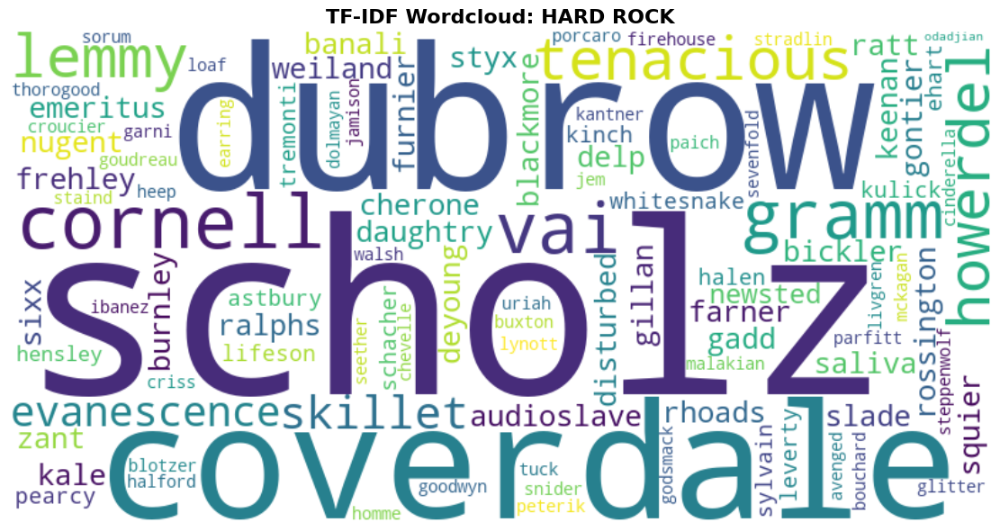

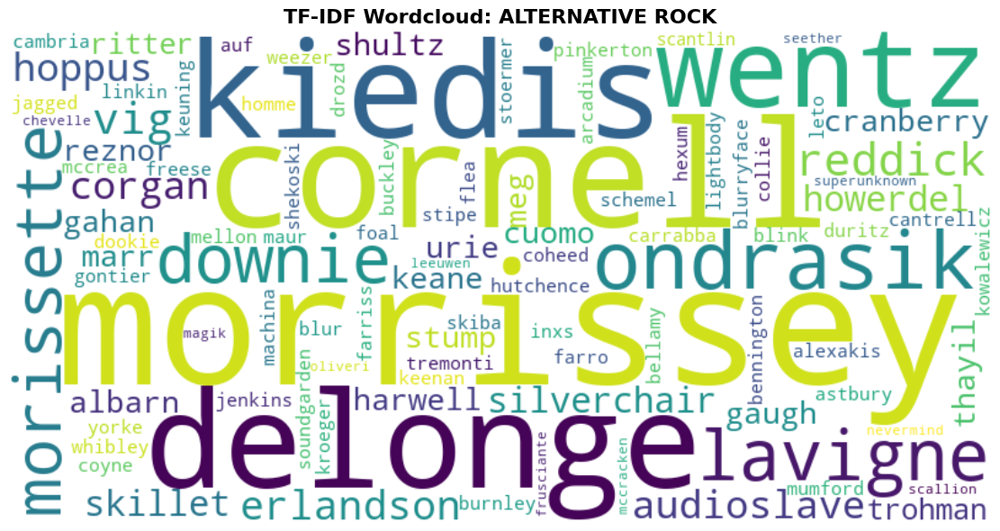

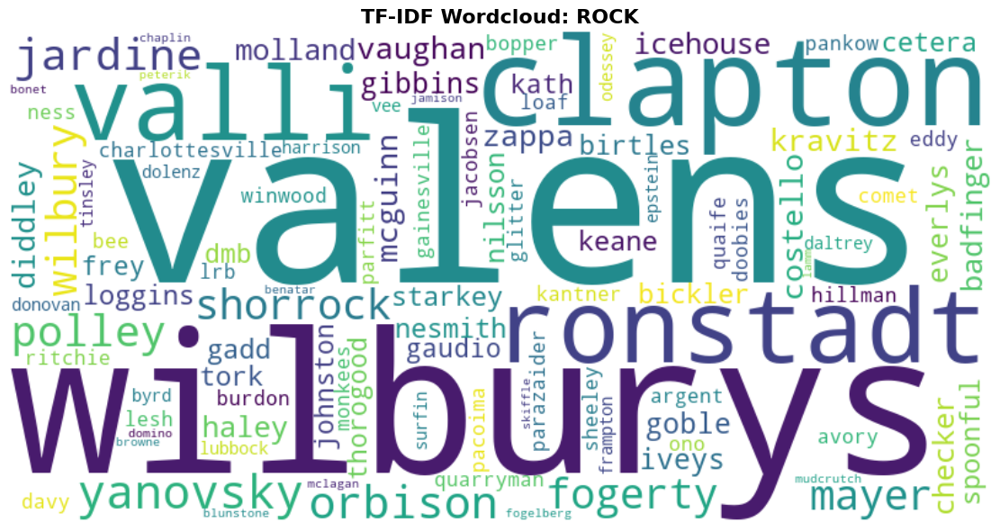

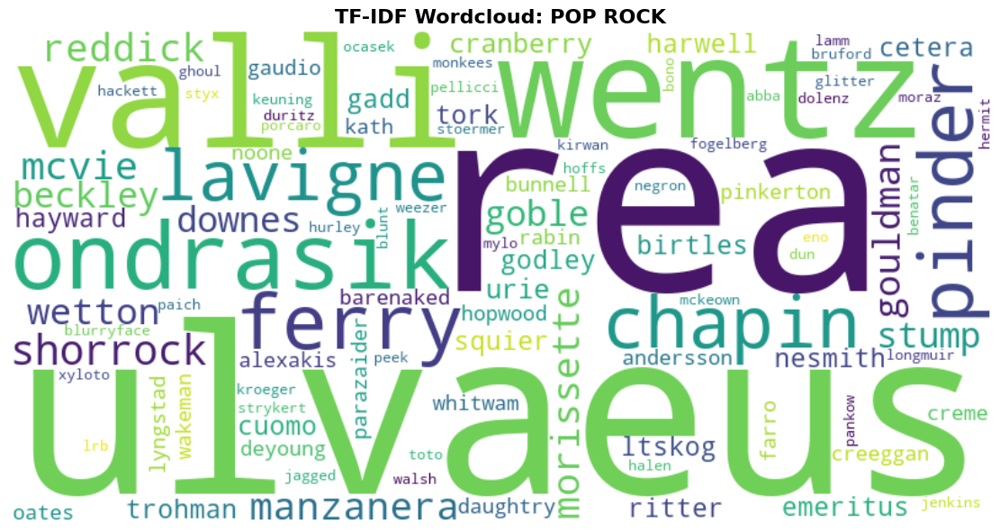

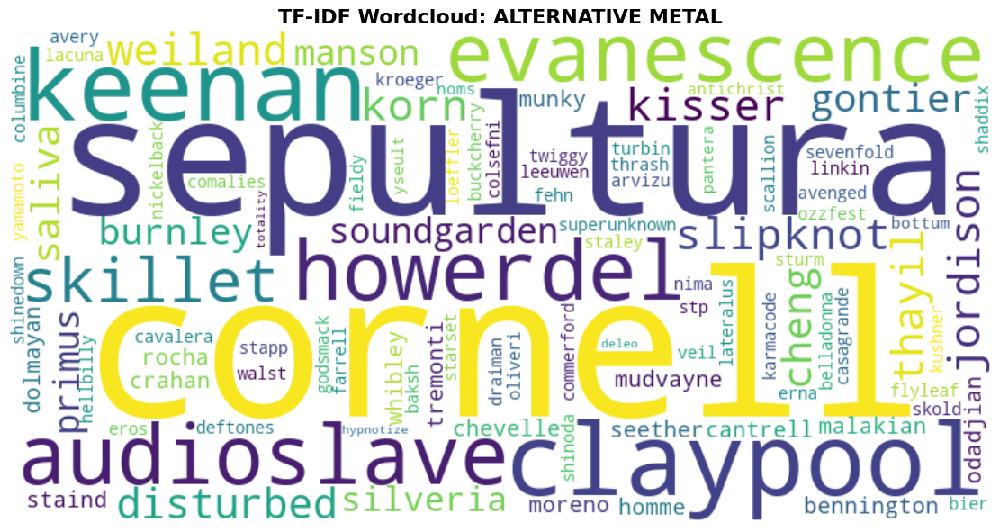

...

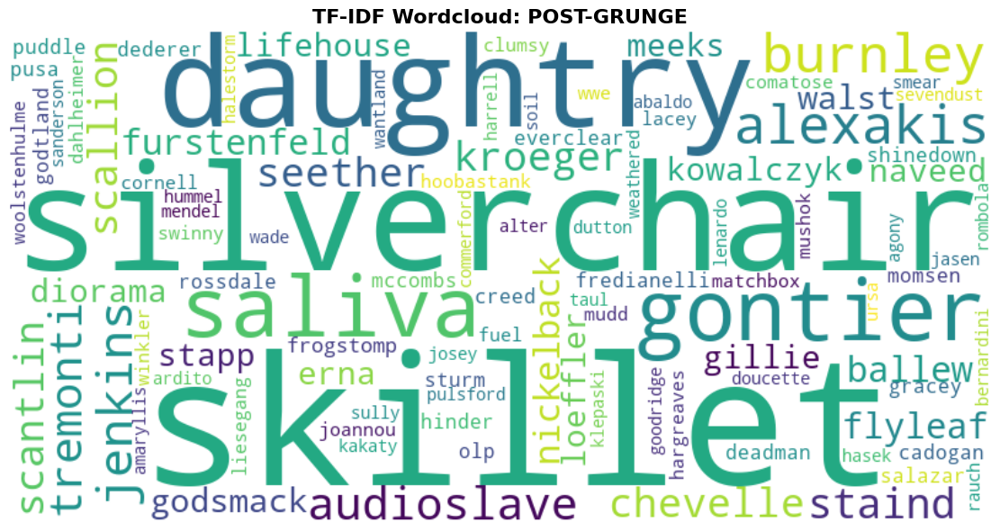

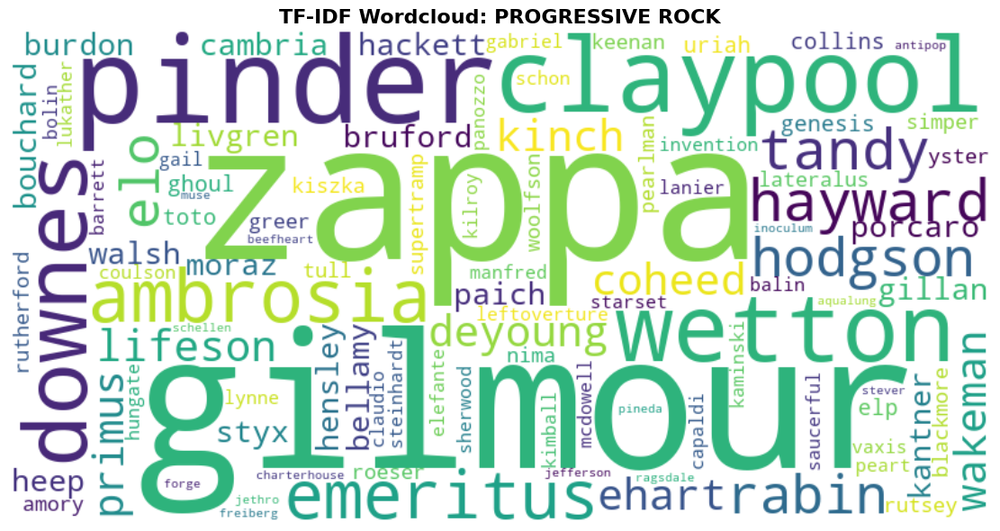

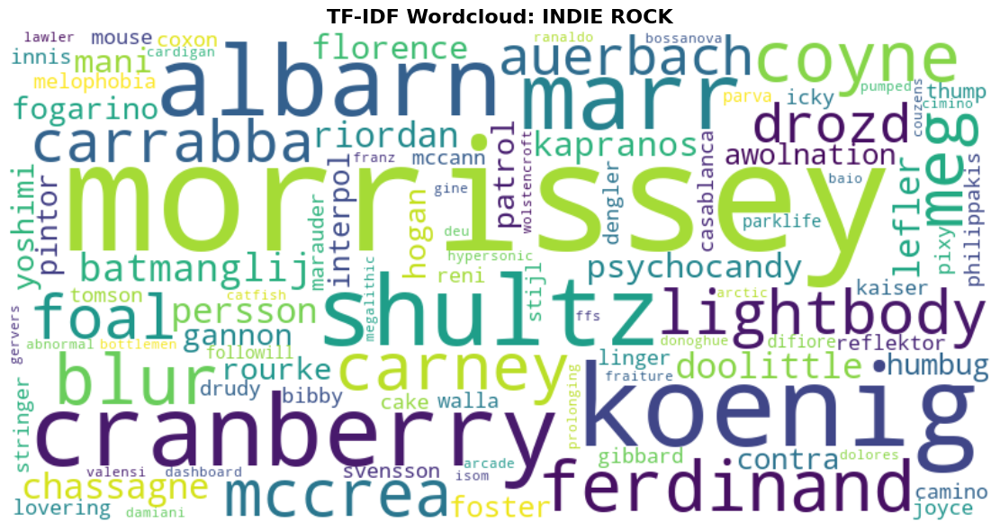

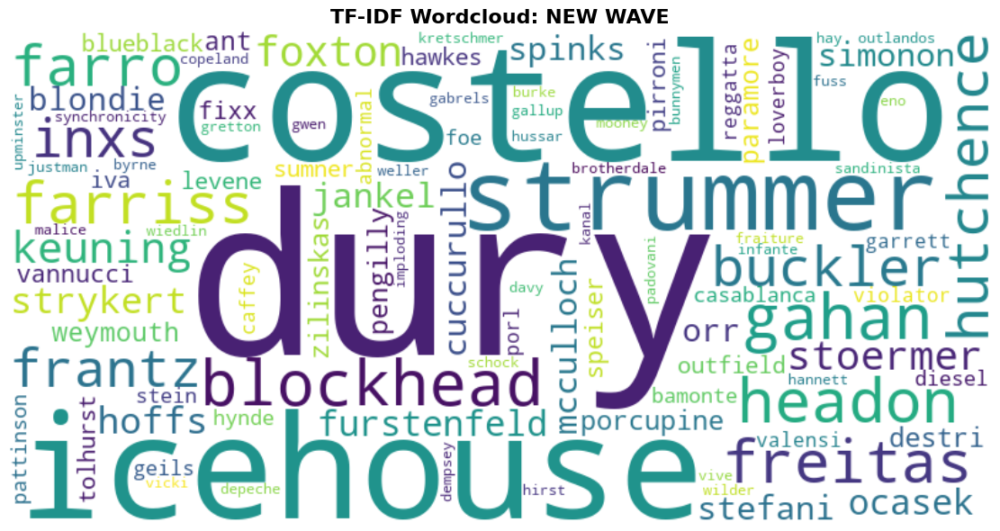

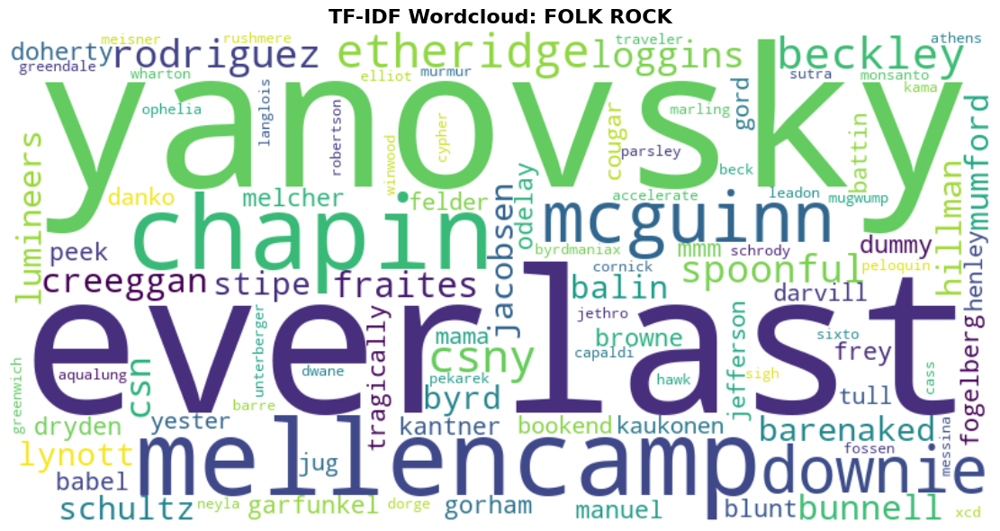

In [ ]:
# Creating TF-IDF wordclouds for top genres
for i, (genre_name, _) in enumerate(top_15_genres, 1): 
    if genre_name not in genre_tfidf:
        continue
    
    # Geting TF-IDF scores form last code cell
    tfidf_scores = genre_tfidf[genre_name]
    
    # Rescaling for wordcloud (multiplied by 1000 for visibility)
    tfidf_scaled = {word: score * 1000 for word, score in tfidf_scores.items()}
    
    # Generating wordcloud
    if tfidf_scaled:
        wc = WordCloud(width=800, height=400, 
                      background_color='white',
                      colormap='viridis',
                      collocations=False,
                      max_words=100).generate_from_frequencies(tfidf_scaled)
        
        plt.figure(figsize=(12, 6))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'TF-IDF Wordcloud: {genre_name.upper()}', 
                 fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
        plt.close()


> ### 2: Community Word Cloud

Preparing documents for structural communities...
  Community  1 -  77 bands, 1926721 chars
  Community  2 - 104 bands, 3616161 chars
  Community  3 - 130 bands, 4142346 chars
  Community  4 -   4 bands,   83174 chars
  Community  5 - 168 bands, 5991255 chars

Calculating TF-IDF for communities...

Creating TF-IDF wordclouds for structural communities...


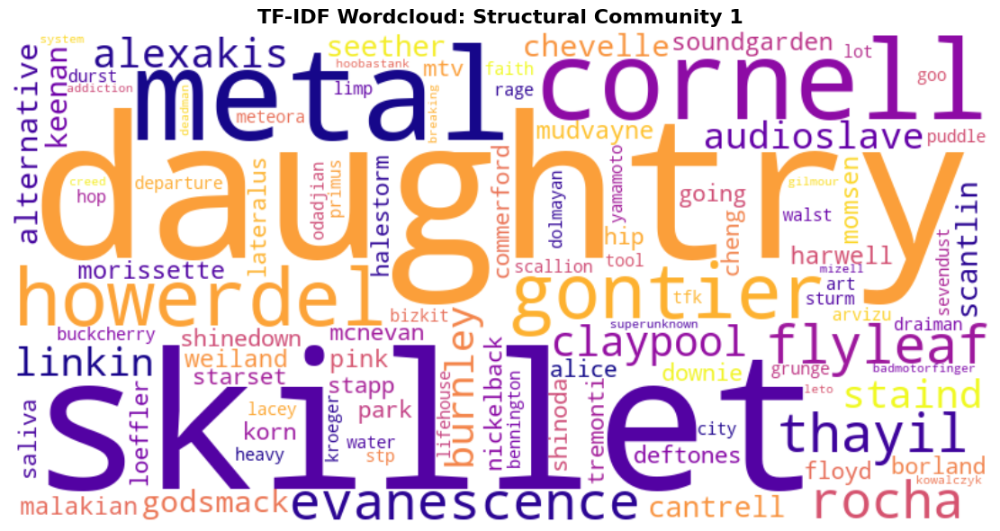

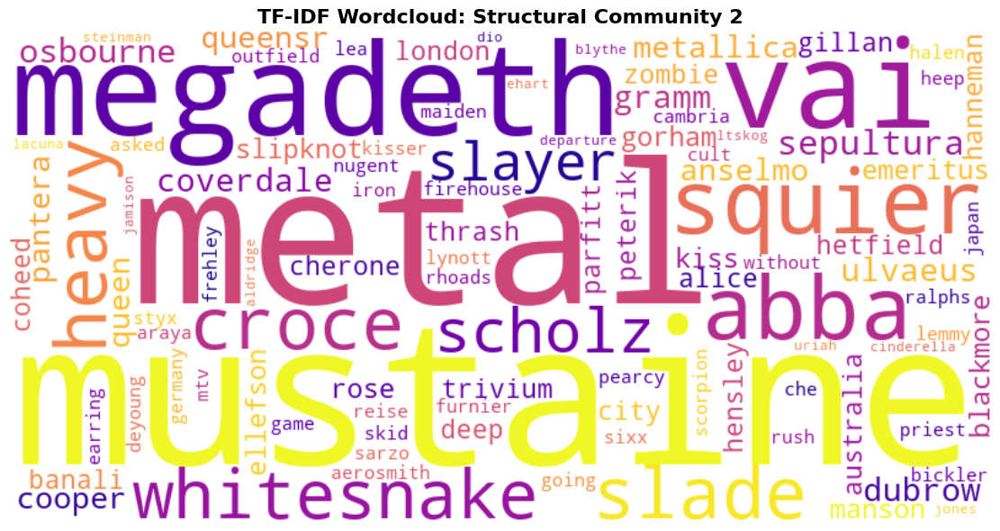

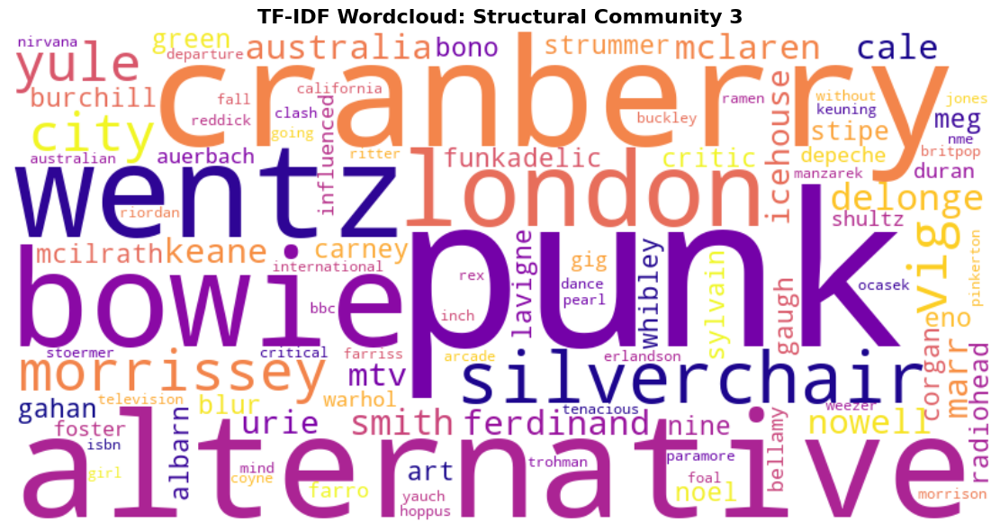

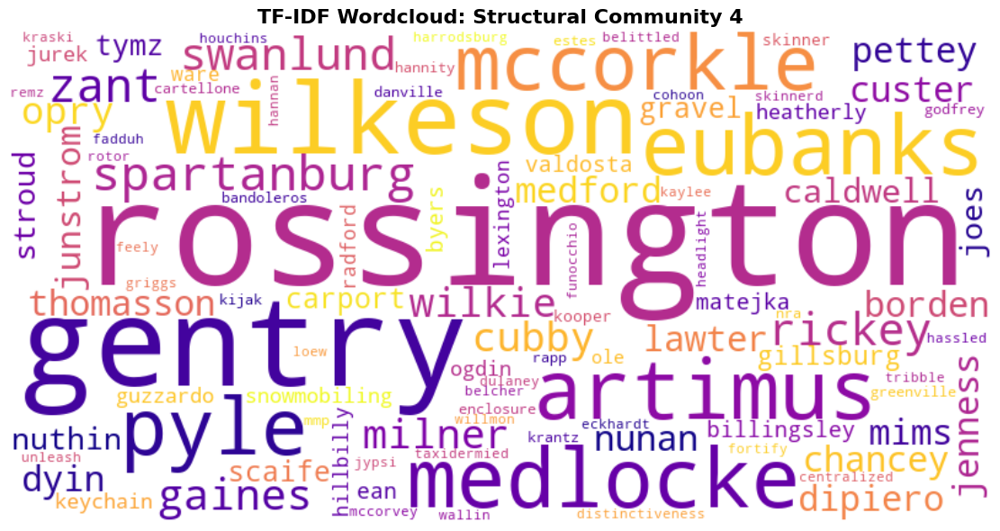

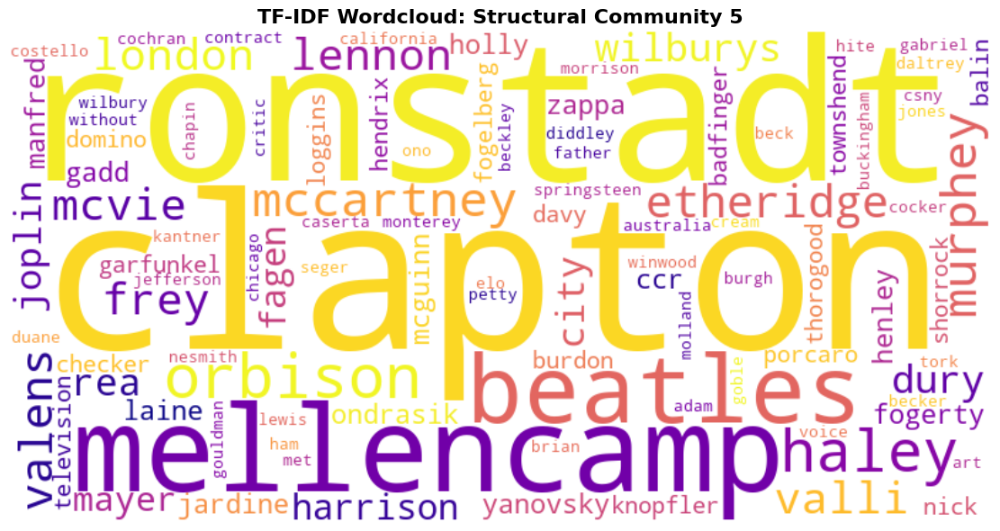

In [ ]:
# Preparing community documents: Used for TF-IDF analysis to identify distinctive terms for each structural community
community_documents = {}
for i, comm in enumerate(communities[:7]):
    doc_text = []
    for band in comm:
        if band in wiki_data:
            doc_text.append(wiki_data[band].get('text', ''))
    community_documents[f'Community_{i+1}'] = ' '.join(doc_text)
    print(f"  Community {i+1:2d} - {len(comm):3d} bands, {len(community_documents[f'Community_{i+1}']):7d} chars")

# Calculating TF for communities
comm_tf = {}
for comm_name, doc_text in community_documents.items():
    tokens = clean_text(doc_text)
    total_words = len(tokens)
    word_counts = Counter(tokens)
    comm_tf[comm_name] = {word: count / total_words 
                         for word, count in word_counts.items()}

# Calculating IDF for communities
all_words_comm = set()
for tf_dict in comm_tf.values():
    all_words_comm.update(tf_dict.keys())

document_frequency_comm = Counter()
for word in all_words_comm:
    for tf_dict in comm_tf.values():
        if word in tf_dict:
            document_frequency_comm[word] += 1

total_documents_comm = len(comm_tf)
idf_comm = {word: np.log(total_documents_comm / df) 
           for word, df in document_frequency_comm.items()}

# Calculating TF-IDF for communities
comm_tfidf = {}
for comm_name, tf_dict in comm_tf.items():
    tfidf_dict = {word: tf_dict[word] * idf_comm[word] 
                 for word in tf_dict.keys()}
    comm_tfidf[comm_name] = tfidf_dict

# Generating wordclouds for communities
for i in range(len(communities)):
    comm_name = f'Community_{i+1}'
    if comm_name not in comm_tfidf:
        continue
    
    tfidf_scores = comm_tfidf[comm_name]
    tfidf_scaled = {word: score * 1000 for word, score in tfidf_scores.items()}
    
    if tfidf_scaled:
        wc = WordCloud(width=800, height=400,
                      background_color='white',
                      colormap='plasma',
                      collocations=False,
                      max_words=100).generate_from_frequencies(tfidf_scaled)
        
        plt.figure(figsize=(12, 6))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'TF-IDF Wordcloud: Structural Community {i+1}',
                 fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
        plt.close()


### Difference between word clouds of genres and communities

* Genre based wordclouds as it says visualizes the genre labels assigned to the bands. Large words => most commonly assosicated with bands of that genre.
* Based on the confusion matrix, genre clouds can give a false impression of homogenity( how similar the elements are to one another), because a genre like 'rock' dominates but is actually distributed across other communities too.

* Community based word clouds show the actual way the structural communities look. The words represent genres but they corrospond to the frequency of the genre within that community.
* Comparing with the confusion matrix, we can see that community based word clouds are varied, i.e., one community might have both 'hard rock' and 'alternative metal' while other has 'pop rock' in the forward.

> * The confusion matrix helps us see that each community is made up of several different genres. No community is made up of only, say 'rock' bands.
> * The genre word cloud just shows which genre names are used most often but doesn't show how genres are spread out in actual communities.  The community based word cloud  leverages the confusion matrix to show which genres stand out in each group.
> * So, if say 'hard rock' bands are found a lot in 2 different communities, that genre will genre will show up big in both of those community's word clouds. In a regular genre word cloud, 'hard rock' might look like its important (overall) but in community word clouds, we can see exactly which communities it's "strong" in.

# Part 4: Sentiment of the artists and communities

The questions below are based on Lecture 8

* Calculate the sentiment of the band/artist pages (it is OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.
* Discuss the sentiment of the communities. Do the findings using TF-IDF during Lecture 7 help you understand your results?

We will be using the [labMT 1.0](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#abstract0) dataset to analyze how happy all the bands wikipedia pages sound.\
The labMT dataset assigns happiness values from 1 to 9 to 10,222 words. where 1 is very sad, 5 is neutral and 9 is very happy.\
The most commonly occuring words also tend to be neutral and throw off sentiment analysis by their sheer volume so in the analysis we only appraise words with happiness values below 4 or above 6, for details see the the [article](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#abstract0)

Analyzing the wikipedia articles of all bands we get the following:

In [ ]:
import pandas as pd
import numpy as np
import json
import re
from collections import Counter


# Loading the labMT 1.0 dataset for hedonometrics
df = pd.read_csv('Data_Set_S1.txt', sep='\t', skiprows=3, header=0)
df.replace("--", np.nan, inplace=True)
numeric_columns = ['twitter_rank', 'google_rank', 'nyt_rank', 'lyrics_rank']
df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')


# Loading the bands dataset we extracted from wikipedia
with open('bands_data_html.json', 'r') as f:
    wiki_data = json.load(f)

# Apply the eq(1) from the labMT page used to asess average happiness
def calculate_average_happiness(words, df, stop_band_width=0):

    happiness_dict = df.set_index('word')['happiness_average'].to_dict()

    word_counts = Counter(words)
    total_words = sum(word_counts.values())
    word_frequencies = {word: count / total_words for word, count in word_counts.items()}

    # apply the stop band filter
    if stop_band_width > 0:
        filter = [word for word, score in happiness_dict.items() if  score < (5 - stop_band_width) or (5 + stop_band_width) < score]
        word_frequencies = {word: freq for word, freq in word_frequencies.items() if word in filter}
    else:
        word_frequencies = {word: freq for word, freq in word_frequencies.items() if word in happiness_dict.keys()}
    
    total_frequency = sum(word_frequencies.values())

    happiness_score = sum(
        happiness_dict.get(word, 0) * freq / total_frequency
        for word, freq in word_frequencies.items()
    )

    # add happiness scores or individual words to the frequencies dict
    word_frequencies = {word: (freq, happiness_dict.get(word, 0)) for word, freq in word_frequencies.items()}

    return happiness_score, sorted(word_frequencies.items(), key=lambda x: x[1], reverse=True)


# Calculate average happiness for all bands
bands_happiness = {}

for band in wiki_data.keys():
    s, _ = calculate_average_happiness(wiki_data[band]["text"].replace(",", "").replace(".", "").split(), df,1)
    bands_happiness[band] = s

# cell executes in 42s

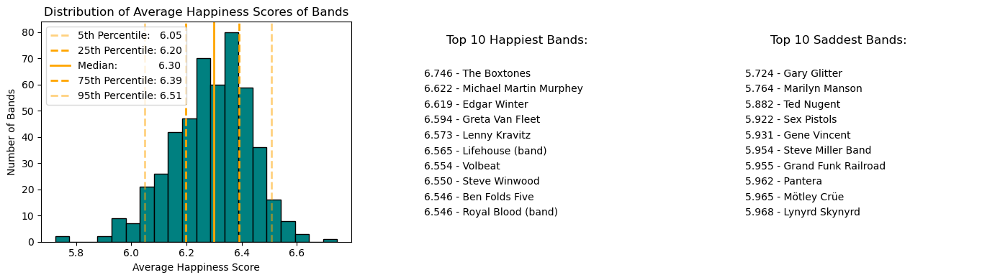

In [15]:
import matplotlib.pyplot as plt
import numpy as np


# Sort bands by happiness scores
sorted_bands = sorted(bands_happiness.items(), key=lambda x: x[1], reverse=True)

# Get the top 10
happiest_bands = sorted_bands[:10]
saddest_bands = sorted_bands[-10:][::-1]

hist, bins = np.histogram(list(bands_happiness.values()), bins=20)
median = np.median(list(bands_happiness.values()))
percentile_5 = np.percentile(list(bands_happiness.values()), 5)
percentile_25 = np.percentile(list(bands_happiness.values()), 25)
percentile_75 = np.percentile(list(bands_happiness.values()), 75)
percentile_95 = np.percentile(list(bands_happiness.values()), 95)

plt.style.use('default')
plt.figure(figsize=(14, 4))
plt.subplot(1, 3, 1)
plt.bar(bins[:-1], hist, width=np.diff(bins), edgecolor='black', align='edge', color='teal')
plt.title('Distribution of Average Happiness Scores of Bands')
plt.axvline(percentile_5, color='orange', linestyle='dashed', linewidth=2, alpha=0.5, label=f'5th Percentile:   {percentile_5:.2f}')
plt.axvline(percentile_25, color='orange', linestyle='dashed', linewidth=2, label=f'25th Percentile: {percentile_25:.2f}')
plt.axvline(median, color='orange', linestyle='solid', linewidth=2, label=f'Median:             {median:.2f}')
plt.axvline(percentile_75, color='orange', linestyle='dashed', linewidth=2, label=f'75th Percentile: {percentile_75:.2f}')
plt.axvline(percentile_95, color='orange', linestyle='dashed', linewidth=2, alpha=0.5, label=f'95th Percentile: {percentile_95:.2f}')
plt.xlabel('Average Happiness Score')
plt.ylabel('Number of Bands')
plt.legend()

plt.subplot(1, 3, 2)
plt.axis('off')

plt.text(0.5, 0.9, "Top 10 Happiest Bands:", fontsize=12, ha='center')
for band, score in happiest_bands:
    plt.text(0.2, 0.75 - 0.07 * (happiest_bands.index((band, score))), f"{score:.3f} - {band}", fontsize=10, ha='left')

plt.subplot(1, 3, 3)
plt.axis('off')

plt.text(0.5, 0.9, "Top 10 Saddest Bands:", fontsize=12, ha='center')
for band, score in saddest_bands:
    plt.text(0.2, 0.75 - 0.07 * (saddest_bands.index((band, score))), f"{score:.3f} - {band}", fontsize=10, ha='left')

plt.tight_layout()
plt.show()

The articles happiness values resemble a normal distribution with extremes being at 5.7 (slight happiness) to 6.7 (moderate happiness). 90% of bands are between 6.05 and 6.51, 50% are between 6.20 and 6.39.\
We have also listed the top 10 happiest and saddest bands. (note that this reflects their wikipedia pages, not their lyrics).

When we check their wikipedia pages we can see that most of the aricles that got rated at "sad" had a high presence of negative words bringing down the score such as a band member dying getting mentioned, allegations, and suprisingly the word "not".\
A weakness of the labMT dataset is that it assigns values for words individually, so negations such as "not happy" will still count "happy" as positive. Still the amount of "not" used can bring down the average as it's counted as a negative word alone.

The top 10 performers often had a lot of mentions about winning awards, and mentions of "first" and "new".

Investigating happiness scores on the 20 most popular genres that were extracted in the previous section gives us the following plot:

In [17]:
import numpy as np

with open("band_genres.json", 'r') as f:
    band_genres = json.load(f)

# write code to analyze happiness scores by genre
genre_happiness = {}

for band, genres in band_genres.items():
    if band in bands_happiness:
        happiness_score = bands_happiness[band]
        for genre in genres:
            if genre not in genre_happiness:
                genre_happiness[genre] = []
            genre_happiness[genre].append(happiness_score)


genre_avg_happiness = {genre: np.mean(scores) for genre, scores in genre_happiness.items()}
genre_band_counts = {genre: len(scores) for genre, scores in genre_happiness.items()}

# Sort by the number of bands
sorted_genres = sorted(genre_happiness.keys(), key=lambda g: genre_band_counts[g], reverse=True)

# keep only genres with at least 20 bands
sorted_genres = [genre for genre in sorted_genres if genre_band_counts[genre] >= 20]

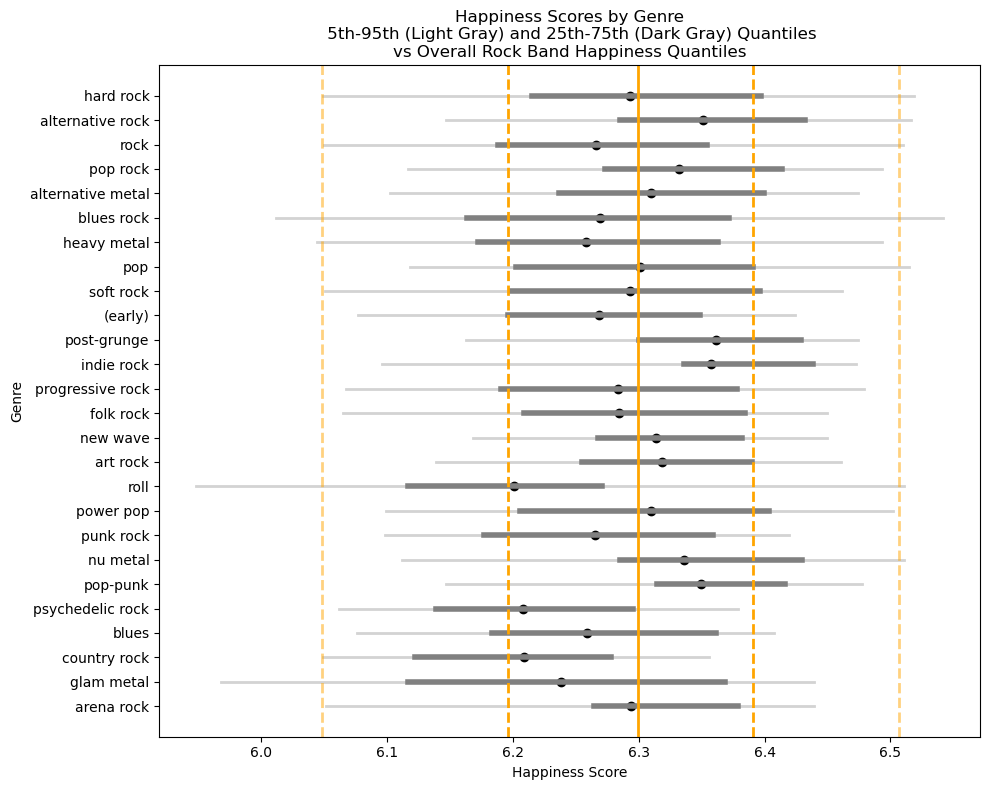

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the 5th, 25th, 75th, and 95th quantiles for each genre
genre_quantiles = {genre: (np.percentile(scores,5),np.percentile(scores, 25), np.percentile(scores, 75), np.percentile(scores, 95)) for genre, scores in genre_happiness.items() if genre in sorted_genres}

# Sort genres by average happiness for better visualization
sorted_genres_by_happiness = sorted(genre_avg_happiness.keys(), key=lambda g: genre_band_counts[g], reverse=False)
sorted_genres_by_happiness = [genre for genre in sorted_genres_by_happiness if genre in sorted_genres]

# Prepare data for the plot
y_positions = range(len(sorted_genres_by_happiness))
x_avg_happiness = [genre_avg_happiness[genre] for genre in sorted_genres_by_happiness]
x_5th = [genre_quantiles[genre][0] for genre in sorted_genres_by_happiness]
x_25th = [genre_quantiles[genre][1] for genre in sorted_genres_by_happiness]
x_75th = [genre_quantiles[genre][2] for genre in sorted_genres_by_happiness]
x_95th = [genre_quantiles[genre][3] for genre in sorted_genres_by_happiness]

median = np.median(list(bands_happiness.values()))
percentile_5 = np.percentile(list(bands_happiness.values()), 5)
percentile_25 = np.percentile(list(bands_happiness.values()), 25)
percentile_75 = np.percentile(list(bands_happiness.values()), 75)
percentile_95 = np.percentile(list(bands_happiness.values()), 95)

# Create the plot
plt.figure(figsize=(10, 8))
for y, x5, x95 in zip(y_positions, x_5th, x_95th):
    plt.plot([x5, x95], [y, y], color='lightgray', alpha=1.0, linewidth=2)
for y, x25, x75 in zip(y_positions, x_25th, x_75th):
    plt.plot([x25, x75], [y, y], color='gray', alpha=1.0, linewidth=4)

plt.scatter(x_avg_happiness, y_positions, color='black')


plt.axvline(percentile_5, color='orange', linestyle='dashed', linewidth=2, alpha=0.5, label=f'5th Percentile:   {percentile_5:.2f}')
plt.axvline(percentile_25, color='orange', linestyle='dashed', linewidth=2, label=f'25th Percentile: {percentile_25:.2f}')
plt.axvline(median, color='orange', linestyle='solid', linewidth=2, label=f'Median:             {median:.2f}')
plt.axvline(percentile_75, color='orange', linestyle='dashed', linewidth=2, label=f'75th Percentile: {percentile_75:.2f}')
plt.axvline(percentile_95, color='orange', linestyle='dashed', linewidth=2, alpha=0.5, label=f'95th Percentile: {percentile_95:.2f}')


# Add labels and title
plt.yticks(y_positions, sorted_genres_by_happiness)
plt.xlabel('Happiness Score')
plt.ylabel('Genre')
plt.title('Happiness Scores by Genre\n 5th-95th (Light Gray) and 25th-75th (Dark Gray) Quantiles\nvs Overall Rock Band Happiness Quantiles')
plt.tight_layout()
plt.show()

Here you can see on a genre basis, the happiness scores of all bands that had that genre's tag.\
The light grey line contains 90% of the scores, the grey 50% and the black dot marks the average score per genre.\
We have also indicated the 90%, 50% and average lines for the full rock dataset that we have seen in the previous figure.

In my opinion, it is a bit easier to tell which genres are happier and which are sadder from this compared to the word clouds.
